In [1]:
import pandas as pd
import numpy as np
import cufflinks as cf
import plotly.offline as py
import plotly.graph_objs as go
import plotly.io as pio
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)  # Set to false if not utilising Jupyter
# If using Jupyter Lab, execute: conda install nodejs
# then execute from the command line: jupyter labextension install jupyterlab-plotly

In [2]:
import os
os.environ["PROJ_LIB"] = os.path.join(os.environ["CONDA_PREFIX"], "share", "proj")
# you may need to copy .../Anaconda3/pkgs/proj4-5.2.x-blah-blah/Library/share/epsg
# to .../Anaconda3/envs/your_environment/share/proj/
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from matplotlib import cm
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

pio.templates.default='plotly_dark'
pd.options.display.max_columns = None
py.init_notebook_mode(connected=True)
cf.set_config_file(offline=True, theme='space')
cf.go_offline()

In [3]:
flight = 'HBAL0484'
directory = '0484'
filespec = f'e:/share/{directory}/{flight}.csv'
outfilespec = f'e:/share/{directory}/{flight}_proc' # Omit file extension (.csv, etc)
ts_string = 'timestampGMT'

# filespec = f'/mnt/e/share/loon/{flight}/{flight}_mapped.csv'
# outfilespec = f'/mnt/e/share/loon/{flight}/{flight}_proc' # Omit file extension (.csv, etc)
downsample = False


In [4]:
df = pd.read_csv(filespec, parse_dates=[ts_string])


In [5]:

if downsample:
    print(f'Downsampling by factor of 1/{downsample}...')
    # Downsample to every n^th observation & reset index
    df = df.iloc[::int(downsample)]
    df = df.reset_index()
    print('Completed downsampling.')
    

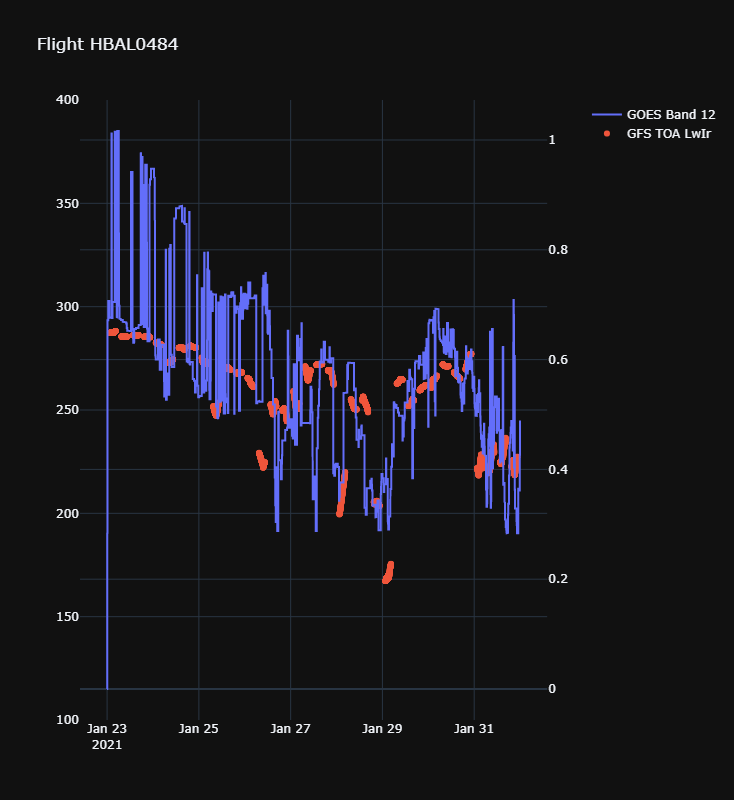

In [6]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=df[ts_string], y=df.rad_flux, mode='lines', name='GOES Band 12'), secondary_y=True)
fig.add_trace(go.Scatter(x=df[ts_string], y=df.lwir_gfs, mode='markers', name='GFS TOA LwIr'), secondary_y=False)
# fig.for_each_yaxis(
#     lambda axis: axis.update_yaxes(range=(100,400)) if axis.index==0 else (),
# )
fig.update_yaxes(range=(100, 400), secondary_y=False)
fig.update_layout(height=800, width=1200, title=f'Flight {flight}')
fig.show()

In [7]:
def plotGribs(item, center_lat=0, center_lon=0):
    data = np.array(df[item].values)
    # print(f'{gr[item].shortName} shape: {data.shape}, min flux: {data.min()} W/m², max flux: {data.max()} W/m²')
    lats = np.array(df['gpsLatitude'].values)
    lons = np.array(df['gpsLongitude'].values)
    center_lat = (lats.max() - lats.min())/2
    center_lon = 0.1
    # center_lon = (lons.max() - lons.min())/2
    print(f'min/max (lat, lon) = ({lats.min()},{lons.min()}), ({lats.max()},{lons.max()})')
    figr = plt.figure(figsize=(16,16))
    m = Basemap(projection='ortho', lon_0=center_lon, lat_0=center_lat)
    # m = Basemap(projection='lcc', lon_0=center_lon, lat_0=center_lat,
    #             llcrnrlon=-179.9, llcrnrlat=lats.min(),
    #             urcrnrlon=179.9, urcrnrlat=lats.max())
    x,y = m(lons, lats)  # compute map projected coordinates

    m.plot(x, y, linewidth=2.5, color='r')

#     cs = m.contourf(x,y,data, np.linspace(0,data.max(),50),cmap=plt.cm.jet, extend='both')
    # t = plt.title(f'{gr[item].name} ({gr[item].typeOfLevel}), {gr[item].units}')
    # plt.colorbar(cs, shrink=.6, pad=0.08)
    m.drawcoastlines()
    m.fillcontinents(color='coral', lake_color='aqua')
    m.drawmapboundary(fill_color='aqua')
    m.drawparallels(np.arange(-90, 120, 30))
    m.drawmeridians(np.arange(0, 420, 60))
    plt.show()
    return


min/max (lat, lon) = (20.387135999999998,-50.2601956), (43.5694649,-30.456237800000004)


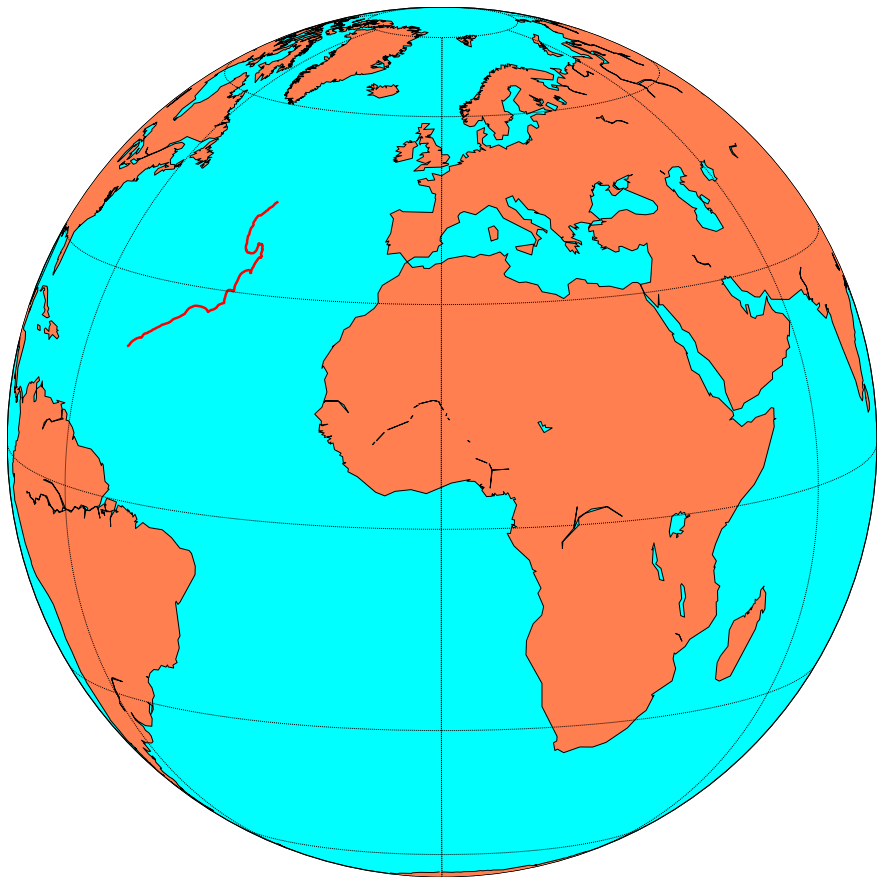

In [8]:
plotlist = ['lwir_gfs']
# center_lat = df.latitudeDecDeg.mean()
# center_lon = -95.
# center_lon = df.longitudeDecDeg.mean()
for plot in plotlist:
    # plotGribs(plot, center_lat, center_lon)
    plotGribs(plot)



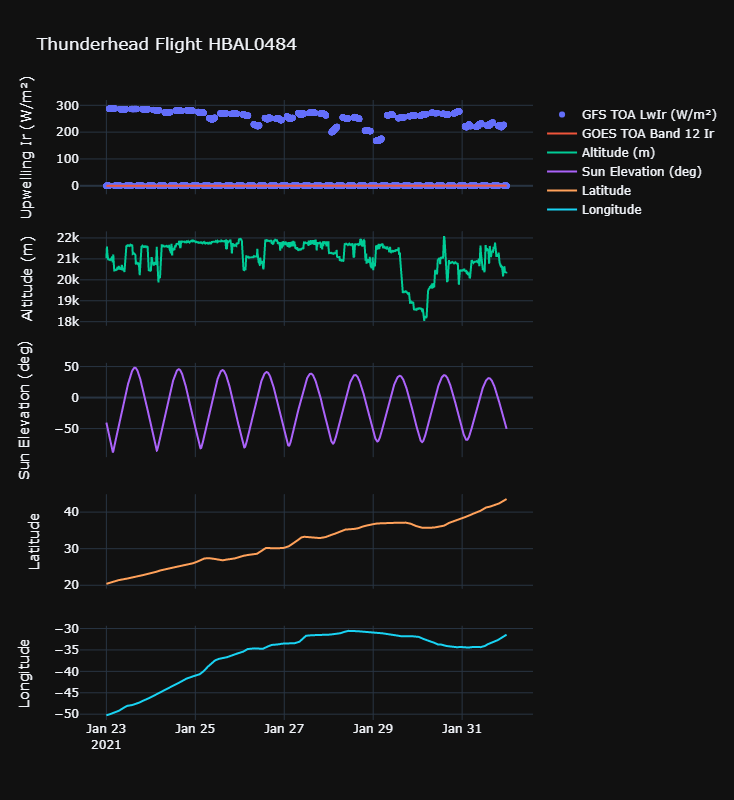

In [9]:

figs = make_subplots(rows=5, cols=1, shared_xaxes=True)
# figs.add_scatter(x=df[ts_string], y=df.noaa_ir, mode='lines', name='Loon noaa_ir', row=1, col=1)
figs.add_scatter(x=df[ts_string], y=df.lwir_gfs, mode='markers', name='GFS TOA LwIr (W/m²)', row=1, col=1)  # Same row/col allows overlay
figs.add_scatter(x=df[ts_string], y=df.rad_flux, row=1, col=1, name='GOES TOA Band 12 Ir')
figs.add_scatter(x=df[ts_string], y=df.gpsAltitude, row=2, col=1, name = 'Altitude (m)')
# figs.add_scatter(x=df[ts_string], y=df.balloonPressurePa, row=3, col=1, name = 'dP (Pa)')
figs.add_scatter(x=df[ts_string], y=df.el_sun, row=3, col=1, name='Sun Elevation (deg)')
figs.add_scatter(x=df[ts_string], y=df.gpsLatitude, row=4, col=1, name='Latitude')
figs.add_scatter(x=df[ts_string], y=df.gpsLongitude, row=5, col=1, name='Longitude')
# figs.add_scatter(x=df[ts_string], y=df.T_amb_gfs, row=5, col=1, name='GFS Ambient Pressure (Pa)')
figs.update_xaxes(spikemode='across+marker')
figs.update_traces(xaxis='x5')  # Needed to bind the spike lines across the three plots. Also, the axis labels will disappear if the bottom axis is not specified.
figs.update_layout(height=800, width=1200, title=f'Thunderhead Flight {flight}', showlegend=True)
# figs.update_xaxes(range=(df.launchTime.max(), df[ts_string].max()))
figs.update_yaxes(title_text='Upwelling Ir (W/m²)', row=1, col=1)
figs.update_yaxes(title_text='Altitude (m)', row=2, col=1)
# figs.update_yaxes(title_text='dP (m)', row=3, col=1)
figs.update_yaxes(title_text='Sun Elevation (deg)', row=3, col=1)
figs.update_yaxes(title_text='Latitude', row=4, col=1)
figs.update_yaxes(title_text='Longitude', row=5, col=1)
# figs.update_yaxes(title_text='P_amb_gfs (Pa)', row=5, col=1)
# figs.update_yaxes(range=(150, 450), row=1, col=1)
figs.update_layout(xaxis2_showticklabels=True)
figs.show()

In [10]:
figs.write_image(f'{outfilespec}.png')


In [11]:
figs.write_html(f'{outfilespec}.html')

In [12]:
df.launchTime.max()

AttributeError: 'DataFrame' object has no attribute 'launchTime'

In [ ]:
dir(fig)

In [ ]:
for axis in fig:
    print(dir(axis))